#### **DECISION TREES**

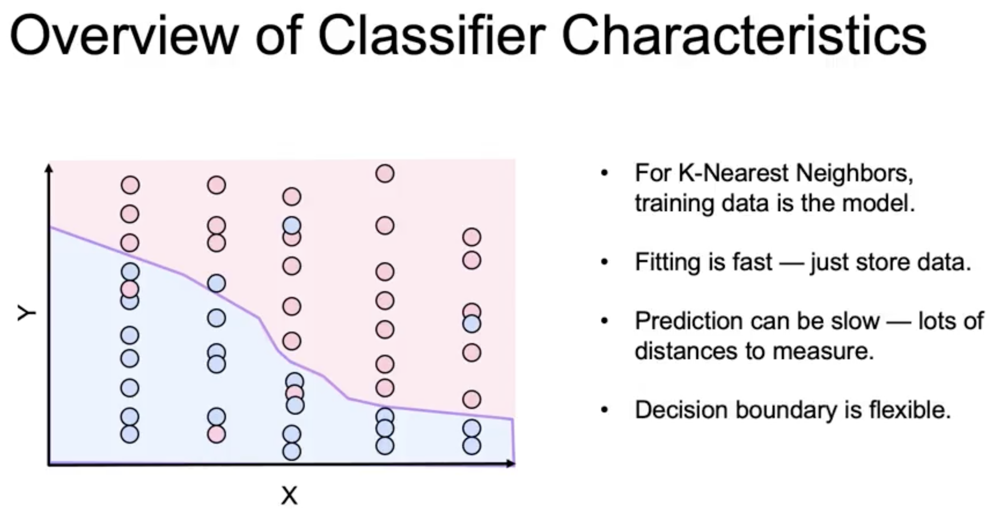

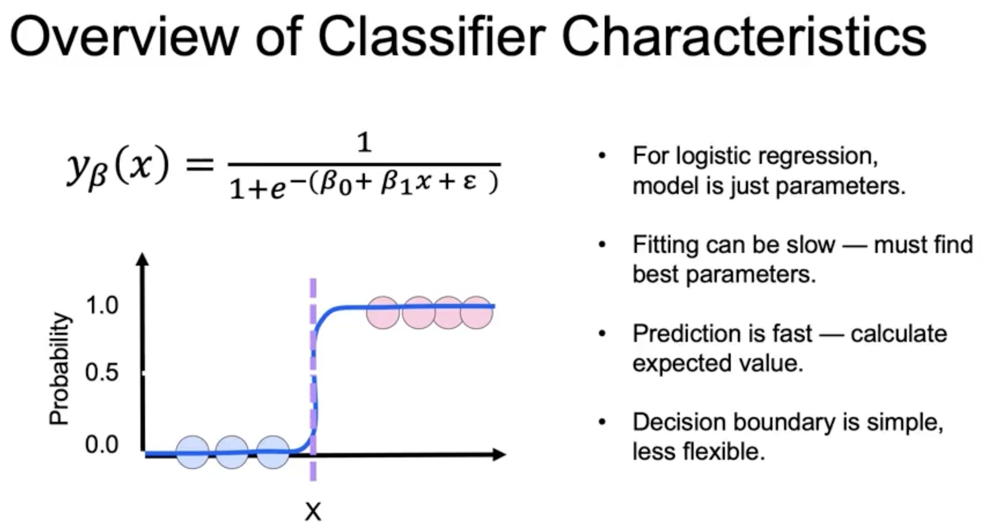

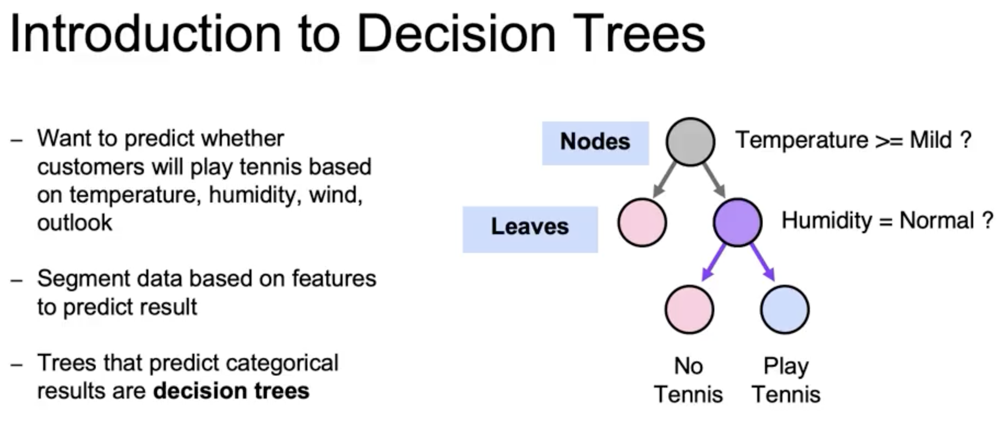

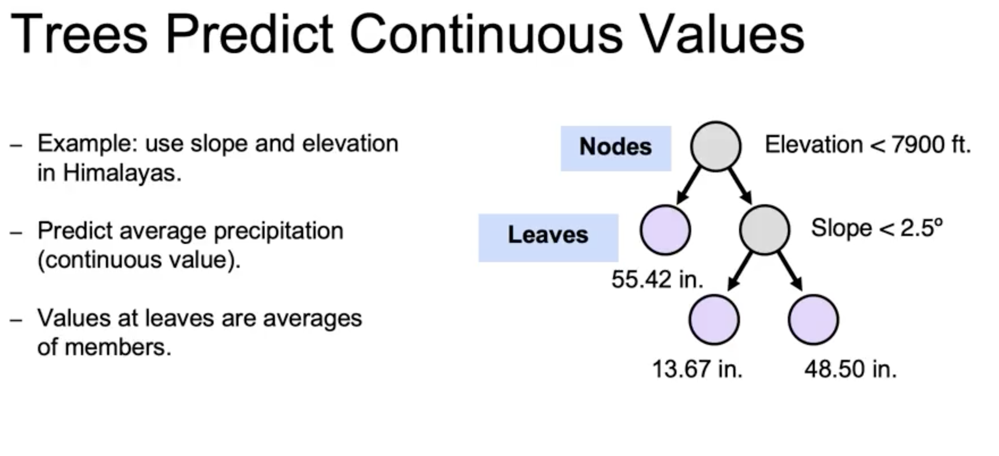

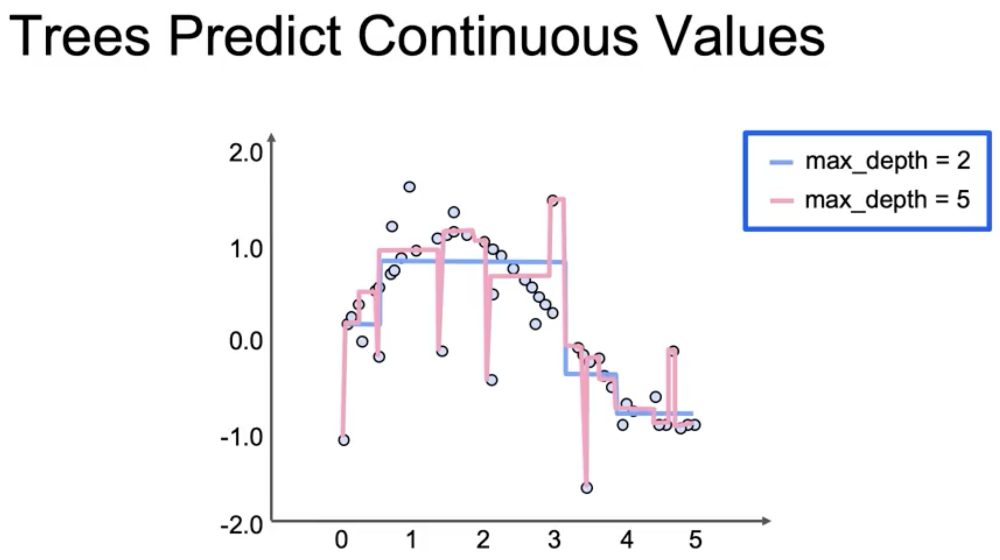

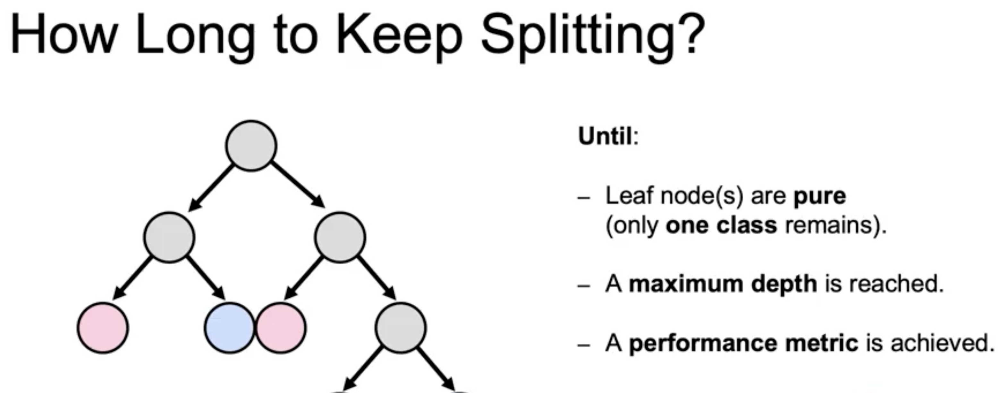

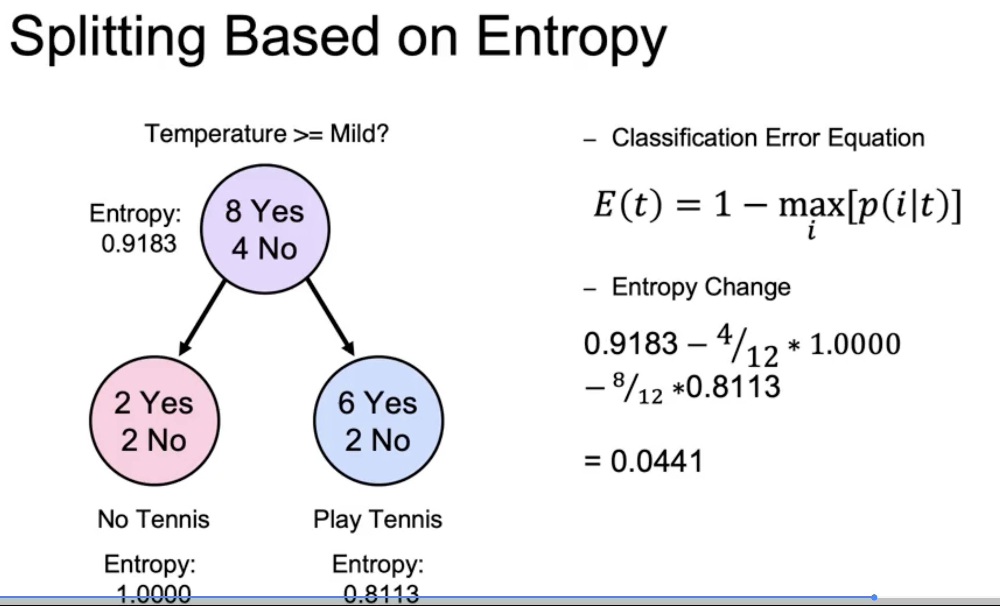

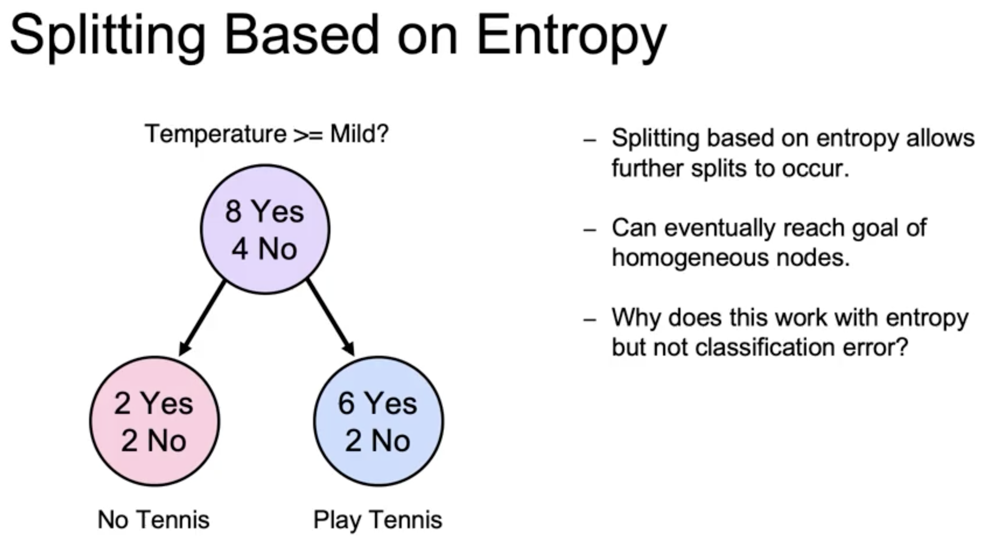

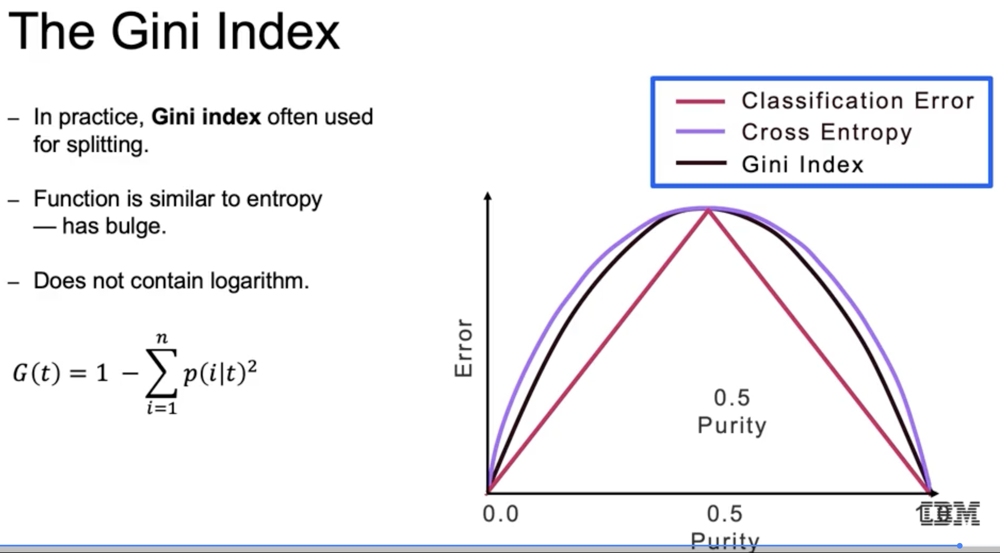

In [2]:
from IPython.display import Image, display

display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/dt_1.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/dt_2.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/dt_3.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/dt_4.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/dt_5.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/dt_6.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/dt_7.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/dt_8.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/dt_9.png"))

#### EXAMPLE: DECISION TREE

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def warning(*args, **kwargs):
    pass
import warnings
warnings.warn = warning

In [16]:
%pip install requests


[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [17]:
import requests
from io import StringIO

url = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML241EN-SkillsNetwork/labs/datasets/Wine_Quality_Data.csv"
response = requests.get(url, verify=False)  # ⚠️ disables certificate verification
data = pd.read_csv(StringIO(response.text))

data.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [18]:
data.dtypes

fixed_acidity           float64
volatile_acidity        float64
citric_acid             float64
residual_sugar          float64
chlorides               float64
free_sulfur_dioxide     float64
total_sulfur_dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
color                    object
dtype: object

In [19]:
# Convert the color feature to an integer. 
# This is a quick way to do it using Pandas.

data['color'] = data.color.replace('white',0).replace('red',1).astype(int)

In [20]:
# Use StratifiedShuffleSplit to split data into train 
# and test sets that are stratified by wine quality.

# All data columns except for color
feature_cols = [x for x in data.columns if x not in 'color']

In [21]:
from sklearn.model_selection import StratifiedShuffleSplit

# Split the data into two parts with 1000 points in the test data
# This creates a generator
strat_shuff_split = StratifiedShuffleSplit(n_splits=1, test_size=1000, random_state=42)

# Get the index values from the generator
train_idx, test_idx = next(strat_shuff_split.split(data[feature_cols], data['color']))

# Create the data sets
X_train = data.loc[train_idx, feature_cols]
y_train = data.loc[train_idx, 'color']

X_test = data.loc[test_idx, feature_cols]
y_test = data.loc[test_idx, 'color']

In [22]:
# check the percent composition of each quality level in the train and test data sets. 

y_train.value_counts(normalize=True).sort_index()

color
0    0.753866
1    0.246134
Name: proportion, dtype: float64

In [23]:
y_test.value_counts(normalize=True).sort_index()

color
0    0.754
1    0.246
Name: proportion, dtype: float64

In [24]:
# Fit a decision tree classifier with no set limits on maximum depth, features, or leaves.

from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=42)
dt = dt.fit(X_train, y_train)

In [25]:
# Determine how many nodes are present and what the depth of this (very large) tree is.

dt.tree_.node_count, dt.tree_.max_depth

(171, 22)

* Using this tree, measure the prediction error in the train and test data sets. What do you think is going on here based on the differences in prediction error?

In [ ]:
# A function to return error metrics.
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def measure_error(y_true, y_pred, label):
    return pd.Series({'accuracy':accuracy_score(y_true, y_pred),
                      'precision': precision_score(y_true, y_pred),
                      'recall': recall_score(y_true, y_pred),
                      'f1': f1_score(y_true, y_pred)},
                      name=label)

The decision tree predicts a little better on the training data than the test data, which is consistent with (mild)  overfitting. Also notice the perfect recall score for the training data. In many instances, this prediction difference is even greater than that seen here. 

In [27]:
# The error on the training and test data sets
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

train_test_full_error = pd.concat([measure_error(y_train, y_train_pred, 'train'),
                              measure_error(y_test, y_test_pred, 'test')],
                              axis=1)

train_test_full_error

,train,test
accuracy,0.999818,0.984000
precision,0.999261,0.963710
recall,1.000000,0.971545
f1,0.999631,0.967611


In [28]:
# Using grid search with cross validation, 
# find a decision tree that performs well on the test data set.

from sklearn.model_selection import GridSearchCV

param_grid = {'max_depth':range(1, dt.tree_.max_depth+1, 2),
              'max_features': range(1, len(dt.feature_importances_)+1)}

GR = GridSearchCV(DecisionTreeClassifier(random_state=42),
                  param_grid=param_grid,
                  scoring='accuracy',
                  n_jobs=-1)

GR = GR.fit(X_train, y_train)

In [29]:
# Determine the number of nodes and the depth of this tree.

GR.best_estimator_.tree_.node_count, GR.best_estimator_.tree_.max_depth

(99, 7)

These test errors are a little better than the previous ones. So it would seem the previous example overfit the data, but only slightly so.

In [30]:
y_train_pred_gr = GR.predict(X_train)
y_test_pred_gr = GR.predict(X_test)

train_test_gr_error = pd.concat([measure_error(y_train, y_train_pred_gr, 'train'),
                                 measure_error(y_test, y_test_pred_gr, 'test')],
                                axis=1)

In [31]:
train_test_gr_error

,train,test
accuracy,0.995816,0.989000
precision,0.998501,0.983539
recall,0.984479,0.971545
f1,0.991440,0.977505


* Re-split the data into X and y parts, this time with residual_sugar being the predicted (y) data. Note: if the indices were preserved from the StratifiedShuffleSplit output above, they can be used again to split the data.
* Using grid search with cross validation, find a decision tree regression model that performs well on the test data set.
* Measure the errors on the training and test sets using mean squared error.
* Make a plot of actual vs predicted residual sugar.

In [32]:
feature_cols = [x for x in data.columns if x != 'residual_sugar']

# Create the data sets
X_train = data.loc[train_idx, feature_cols]
y_train = data.loc[train_idx, 'residual_sugar']

X_test = data.loc[test_idx, feature_cols]
y_test = data.loc[test_idx, 'residual_sugar']

In [33]:
from sklearn.tree import DecisionTreeRegressor

dr = DecisionTreeRegressor().fit(X_train, y_train)

param_grid = {'max_depth':range(1, dr.tree_.max_depth+1, 2),
              'max_features': range(1, len(dr.feature_importances_)+1)}

GR_sugar = GridSearchCV(DecisionTreeRegressor(random_state=42),
                     param_grid=param_grid,
                     scoring='neg_mean_squared_error',
                      n_jobs=-1)

GR_sugar = GR_sugar.fit(X_train, y_train)

The number of nodes and the maximum depth of the tree. This tree has lots of nodes, which is not so surprising given the continuous data.

In [34]:
GR_sugar.best_estimator_.tree_.node_count, GR_sugar.best_estimator_.tree_.max_depth

(7957, 29)

The error on train and test data sets. Since this is continuous, we will use mean squared error.

In [35]:
from sklearn.metrics import mean_squared_error

y_train_pred_gr_sugar = GR_sugar.predict(X_train)
y_test_pred_gr_sugar  = GR_sugar.predict(X_test)

train_test_gr_sugar_error = pd.Series({'train': mean_squared_error(y_train, y_train_pred_gr_sugar),
                                         'test':  mean_squared_error(y_test, y_test_pred_gr_sugar)},
                                          name='MSE').to_frame().T

train_test_gr_sugar_error

,train,test
MSE,0.000099,2.798916


[Text(0.5, 0, 'Test'), Text(0, 0.5, 'Predict'), (0.0, 35.0), (0.0, 35.0)]

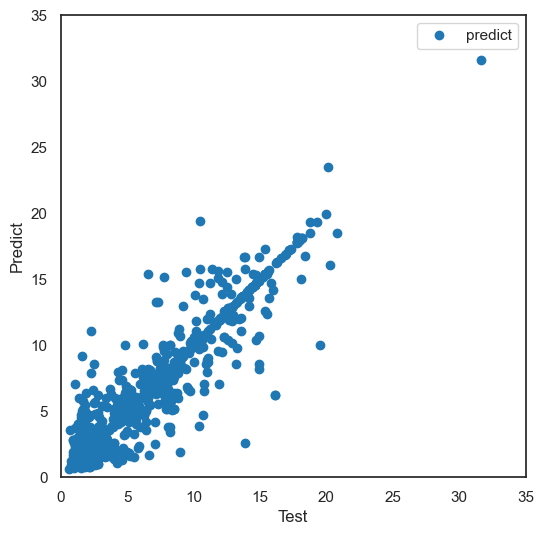

In [36]:
# A plot of actual vs predicted residual sugar.

sns.set_context('notebook')
sns.set_style('white')
fig = plt.figure(figsize=(6,6))
ax = plt.axes()

ph_test_predict = pd.DataFrame({'test':y_test.values,
                                'predict': y_test_pred_gr_sugar}).set_index('test').sort_index()

ph_test_predict.plot(marker='o', ls='', ax=ax)
ax.set(xlabel='Test', ylabel='Predict', xlim=(0,35), ylim=(0,35))

##### **EXAMPLE 2: DECISION TREES**

In [45]:
!pip install --upgrade scikit-learn

  Using cached scikit_learn-1.7.2-cp311-cp311-macosx_12_0_arm64.whl.metadata (11 kB)
Using cached scikit_learn-1.7.2-cp311-cp311-macosx_12_0_arm64.whl (8.6 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.4.2
    Uninstalling scikit-learn-1.4.2:
      Successfully uninstalled scikit-learn-1.4.2


In [46]:
import pandas as pd
import numpy as np
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn import metrics
# Evaluation metrics related methods
from sklearn.metrics import classification_report, accuracy_score, f1_score, confusion_matrix, precision_recall_fscore_support, precision_score, recall_score

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [47]:
rs=123

In [49]:
# load the tumor dataset as a Pandas dataframe

response = requests.get("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML241EN-SkillsNetwork/labs/datasets/tumor.csv", verify=False)
from io import StringIO
tumor_df = pd.read_csv(StringIO(response.text))

In [50]:
tumor_df.head()

,Clump,UnifSize,UnifShape,MargAdh,SingEpiSize,BareNuc,BlandChrom,NormNucl,Mit,Class
0,5,1,1,1,2,1,3,1,1,0
1,5,4,4,5,7,10,3,2,1,0
2,3,1,1,1,2,2,3,1,1,0
3,6,8,8,1,3,4,3,7,1,0
4,4,1,1,3,2,1,3,1,1,0


Each observation in this dataset contains lab tests results about a tumor sample, such as clump or shapes. Based on these lab test results or features, we want to build a classification model to predict if this tumor sample is malicious (cancer) and benign. The target variable y is specified in the Class column.

In [51]:
# split the dataframe into train and testing data

# Get the input features
X = tumor_df.iloc[:, :-1]
# Get the target variable
y = tumor_df.iloc[:, -1:]

In [52]:
# Split the training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state = rs)

##### Train a default decision tree

In [53]:
# Train a decision tree with all default arguments
model = DecisionTreeClassifier(random_state=rs)

In [54]:
# Then we can train the decision tree model with training and testing data
model.fit(X_train, y_train.values.ravel())

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,123
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [55]:
# make predictions on the test data

preds = model.predict(X_test)

In [56]:
# the utility method to evaluate the trained decision tree model and 
# output some standard evaluation metrics.

def evaluate_metrics(yt, yp):
    results_pos = {}
    results_pos['accuracy'] = accuracy_score(yt, yp)
    precision, recall, f_beta, _ = precision_recall_fscore_support(yt, yp, average='binary')
    results_pos['recall'] = recall
    results_pos['precision'] = precision
    results_pos['f1score'] = f_beta
    return results_pos


In [57]:
evaluate_metrics(y_test, preds)

{'accuracy': 0.9562043795620438,
 'recall': 0.9583333333333334,
 'precision': 0.92,
 'f1score': 0.9387755102040817}

* we can see that the trained decision model has very good classification results on the testing data, with a very high F1 score around 0.94. Next, let's try to visualize and interpret the trained decision tree model.

In [58]:
# Visualize the trained decision tree

def plot_decision_tree(model, feature_names):
    plt.subplots(figsize=(25, 20)) 
    tree.plot_tree(model, 
                       feature_names=feature_names,  
                       filled=True)
    plt.show()

In [59]:
feature_names = X.columns.values

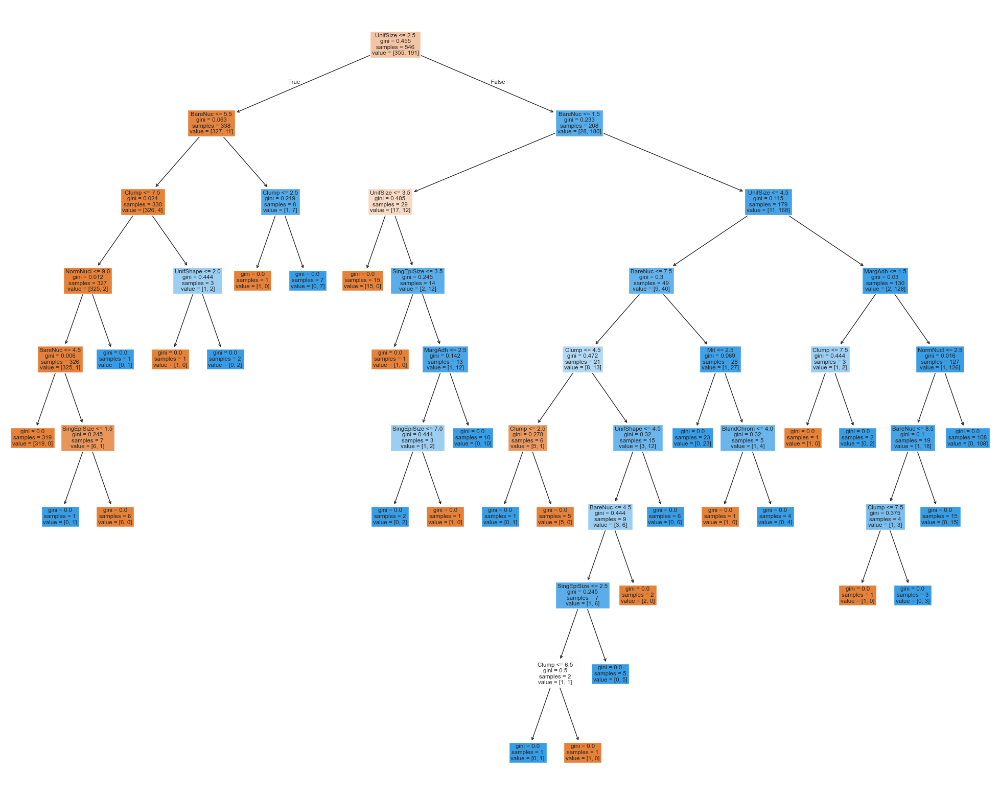

In [60]:
plot_decision_tree(model, feature_names)

the result is a relatively complex decision tree model being plotted. First, you may notice the decision tree is color-labeled, orange node means a majority of samples in the node belong to `Class 0` and blue node means a majority of samples in the node belong to `Class 1`, and white node means it has an equal amount of `Class 0` and `Class 1` samples.

Because the tree is very big, so the rules and split threshold on each node are very difficult to see. In addition, big decision trees may easily bring large variance and cause overfitting. Next, let's try to build simplified decision trees, and hopefully the simplified decision trees may generate even better results.

##### CUSTOMIZE THE DECISION TREE

The `DecisionTreeClassifier` has many arguments (model hyperparameters) that can be customized and eventually tune the generated decision tree classifiers. Among these arguments, there are three commonly tuned arguments as follows:
- criterion: `gini` or `entropy`, which specifies which criteria to be used when splitting a tree node
- max_depth: a numeric value to specify the max depth of the tree. Larger tree depth normally means larger model complexity
- min_samples_leaf: The minimal number of samples in leaf nodes. Larger samples in leaf nodes will tend to generate simpler trees

Let's first try the following hyperparameter values:
- criterion = 'entropy'
- max_depth = 10
- min_samples_leaf=3

In [61]:
# criterion = 'entropy'
# max_depth = 10
# min_samples_leaf=3
custom_model = DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=3, random_state=rs)

In [62]:
# train and evaluate the customized model

custom_model.fit(X_train, y_train.values.ravel())
preds = custom_model.predict(X_test)
evaluate_metrics(y_test, preds)

{'accuracy': 0.9635036496350365,
 'recall': 0.9166666666666666,
 'precision': 0.9777777777777777,
 'f1score': 0.946236559139785}

* Its F1 score has increased to 0.946 now, which seems better than the previous default decision tree model.

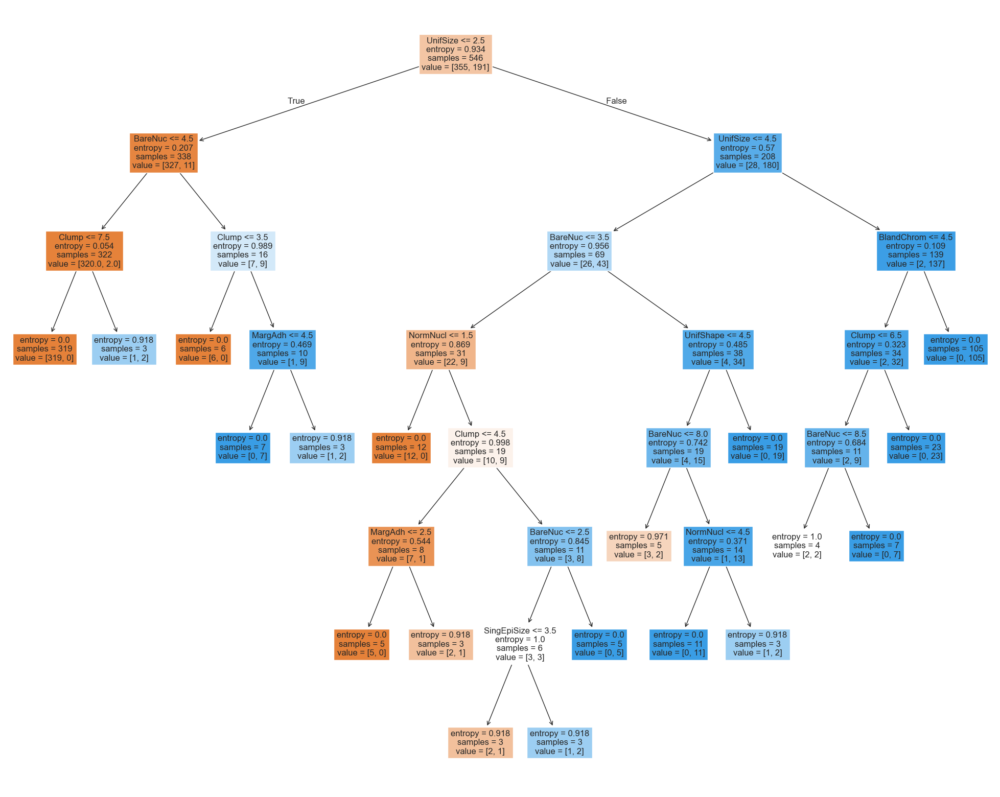

In [63]:
# Plot the decision tree
plot_decision_tree(custom_model, feature_names)

As you can see the tuned decision tree above is much simpler than the default decision tree model. We can see from each node, it's split feature and threshold, and entropy difference before and after a split.

Lastly, let's try to find the optimized hyperparameters, which can produce the highest F1 score, via GridSearch cross-validation.

In [64]:
# define a params_grid dict object to contain the parameter candidates

params_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 5]
}

In [65]:
# Then we create a default decision tree classifier to be tuned:

model = DecisionTreeClassifier(random_state=rs)

In [66]:
# use the GridSearchCV to search the best parameters 
# generating the highest F1 score.

grid_search = GridSearchCV(estimator = model, 
                        param_grid = params_grid, 
                        scoring='f1',
                        cv = 5, verbose = 1)
grid_search.fit(X_train, y_train.values.ravel())
best_params = grid_search.best_params_

Fitting 5 folds for each of 24 candidates, totalling 120 fits


In [67]:
best_params

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 5}